## ICA SUBJECT 2900

In [1]:
from TFG_utils import (returnFiles, take_vmrk_files, take_vhdr_files, take_eeg_files, plot_freq_response, plot_PSD, 
                       plot_eeg_channel_corrected, plot_residual_PSD, plot_spots, Get_Start_End_mrk, 
                       Get_spot_start_samples, filtering_track, get_alpha_pow)
import mne, csv
import numpy as np
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
print('MNE version:',mne.__version__)

%matplotlib notebook
verbose=False

MNE version: 0.20.7


In [2]:
%matplotlib notebook

**COLLECTING DATA**

In [3]:
foldername = 'EEG_folders'
EEG_files= returnFiles(foldername)

vmrk_files= take_vmrk_files(EEG_files)
vhdr_files= take_vhdr_files(EEG_files)
eeg_files= take_eeg_files(EEG_files)

i= 3 # Choosing EEG recording to use

vmrk_filename= vmrk_files[i]
vhdr_filename= vhdr_files[i]
eeg_filename= eeg_files[i]

raw_eeg = mne.io.read_raw_brainvision(vhdr_files[i],verbose=verbose).load_data(verbose=verbose)
data,times= raw_eeg[:]
info= raw_eeg.info
fs= int(info['sfreq'])

#Selecting channel to represent:
ch = 2 #Channel F3; ch = 28 #Channel F4;ch = 3 #Channel F7; ch = 29 #Channel F8

subject= eeg_filename[-8:-4]
print('\n')
print('Subject:',subject)
print('Channel:', info['ch_names'][ch])



Subject: 2900
Channel: F3


### SEPARATE SPOTS

In [4]:
spots_times_sec = [0, 60, 120, 180, 226, 287, 347] # Time (sec) at which each spot begins
ini= int(60)*int(fs) #samples of 1st min of basal activity
start_end=Get_Start_End_mrk(vmrk_files[i]) # markers of the spots
spots_time=Get_spot_start_samples(start_end,fs, spots_times_sec) # Time (samples) at which each spot begins

In [5]:
ba=[]
sp1=[]
sp2=[]
sp3=[]
sp4=[]
sp5=[]
sp6=[]

for ch in range(len(info['ch_names'])):
    ba.append(data[ch,spots_time[0]:spots_time[1]]) #ba activity
    sp1.append(data[ch,spots_time[1]:spots_time[2]]) #1st spot
    sp2.append(data[ch,spots_time[2]:spots_time[3]]) #2nd spot
    sp3.append(data[ch,spots_time[3]:spots_time[4]]) #3rd spot
    sp4.append(data[ch,spots_time[4]:spots_time[5]]) #4th spot
    sp5.append(data[ch,spots_time[5]:spots_time[6]]) #5th spot
    sp6.append(data[ch,spots_time[6]:]) #6th spot

ba  = mne.io.RawArray(ba, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp1 = mne.io.RawArray(sp1, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp2 = mne.io.RawArray(sp2, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp3 = mne.io.RawArray(sp3, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp4 = mne.io.RawArray(sp4, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp5 = mne.io.RawArray(sp5, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp6 = mne.io.RawArray(sp6, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)

### FILTERING

In [6]:
ba_filt  = filtering_track(ba)
sp1_filt = filtering_track(sp1)
sp2_filt = filtering_track(sp2)
sp3_filt = filtering_track(sp3)
sp4_filt = filtering_track(sp4)
sp5_filt = filtering_track(sp5)
sp6_filt = filtering_track(sp6)

# ICA

In [7]:
n_components= 20

**Basal Activity**

<IPython.core.display.Javascript object>


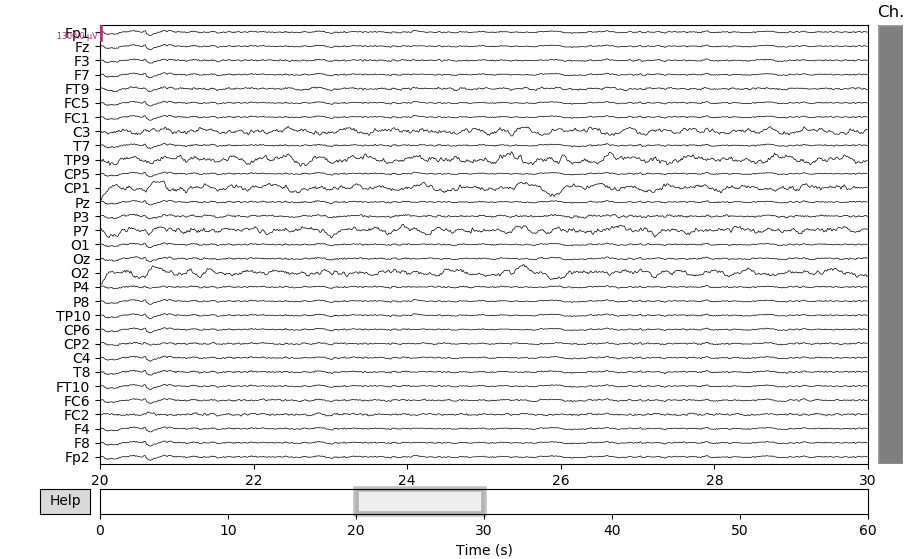

In [8]:
ba_filt.plot(scalings={"eeg": 65e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 3.5s.


<IPython.core.display.Javascript object>


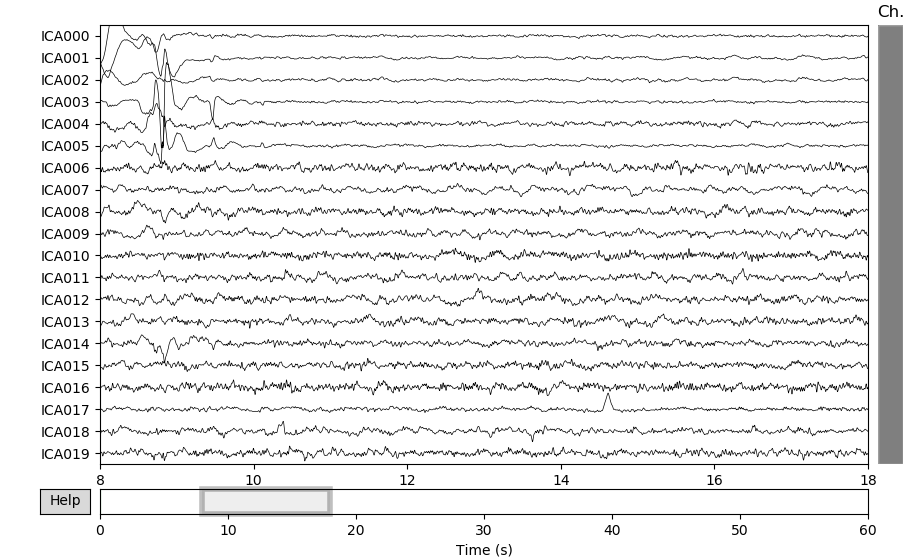

In [9]:
ba_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(ba_filt)
ba_ica.plot_sources(inst=ba_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


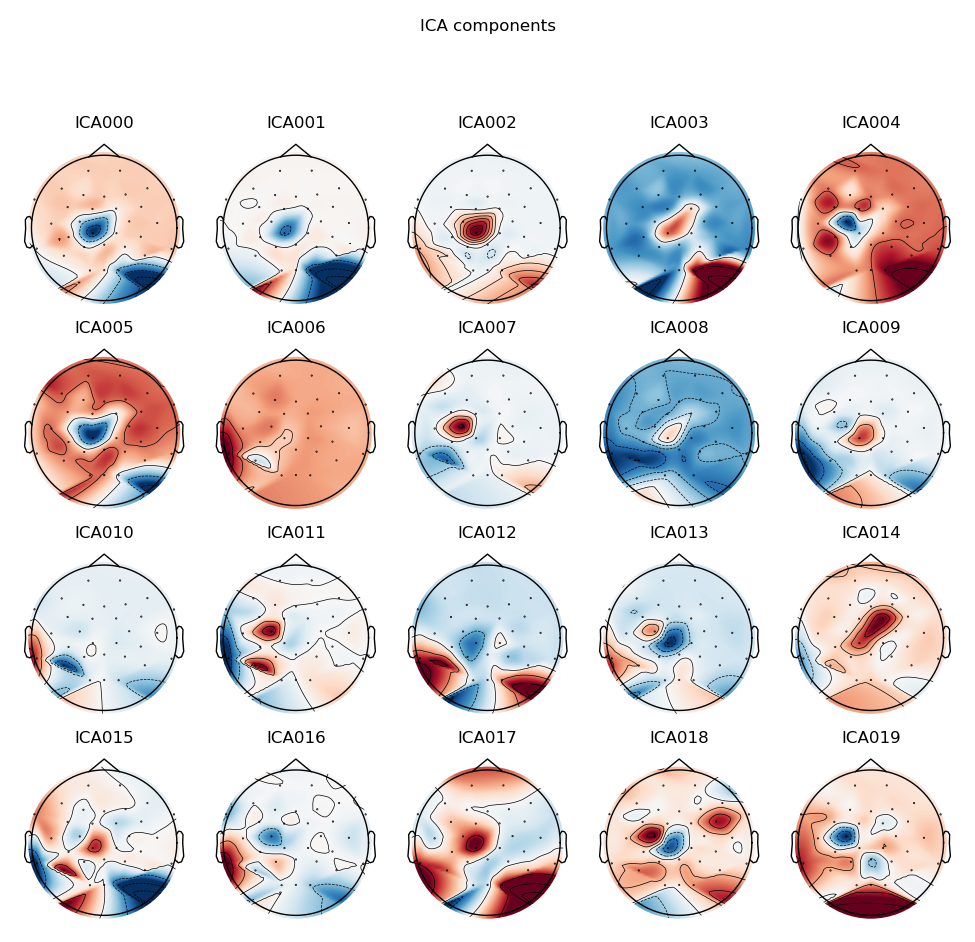

In [10]:
ba_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 8 ICA components


<IPython.core.display.Javascript object>


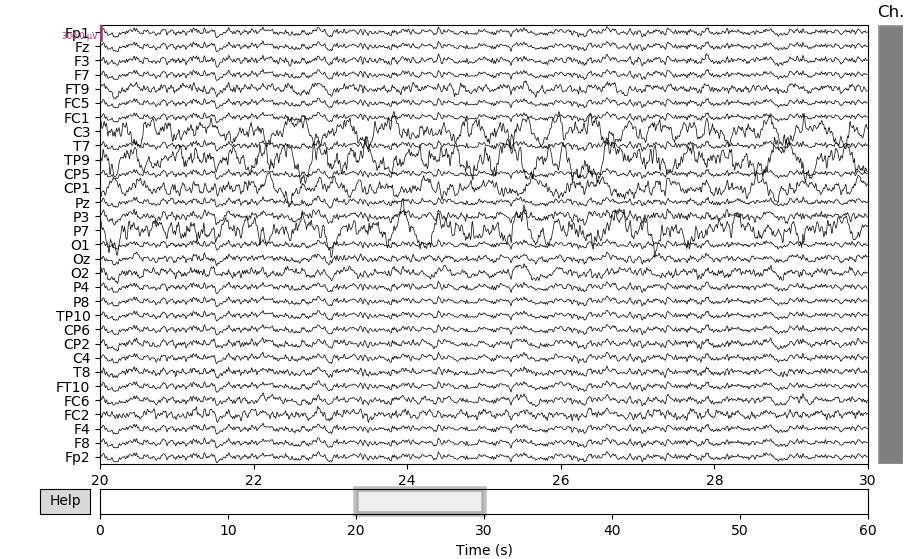

In [11]:
ba_ica.exclude = [0,1,2,3,4,5,15,17]
ba_corrected = ba_filt.copy()
ba_ica.apply(ba_corrected)
ba_corrected.plot(scalings={"eeg": 15e-5}, title='After ICA (basal activity)', verbose=verbose, start=20, n_channels=31)
plt.show()

**Spot 1**

<IPython.core.display.Javascript object>


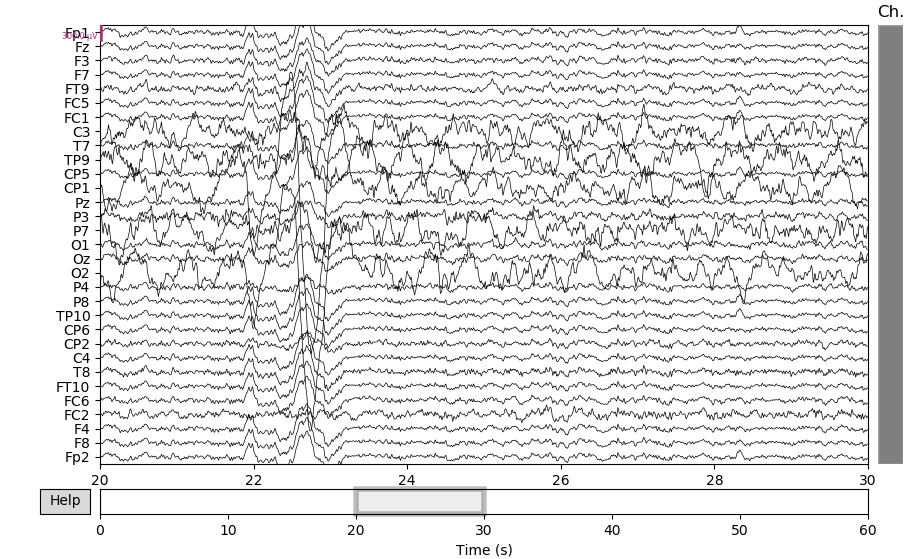

In [12]:
sp1_filt.plot(scalings={"eeg": 15e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 4.0s.


<IPython.core.display.Javascript object>


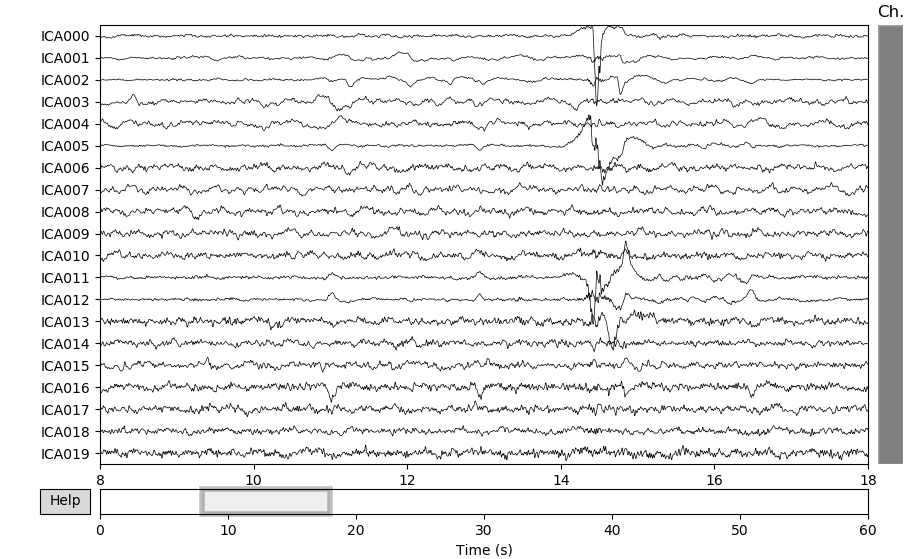

In [13]:
sp1_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(sp1_filt)
sp1_ica.plot_sources(inst=sp1_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


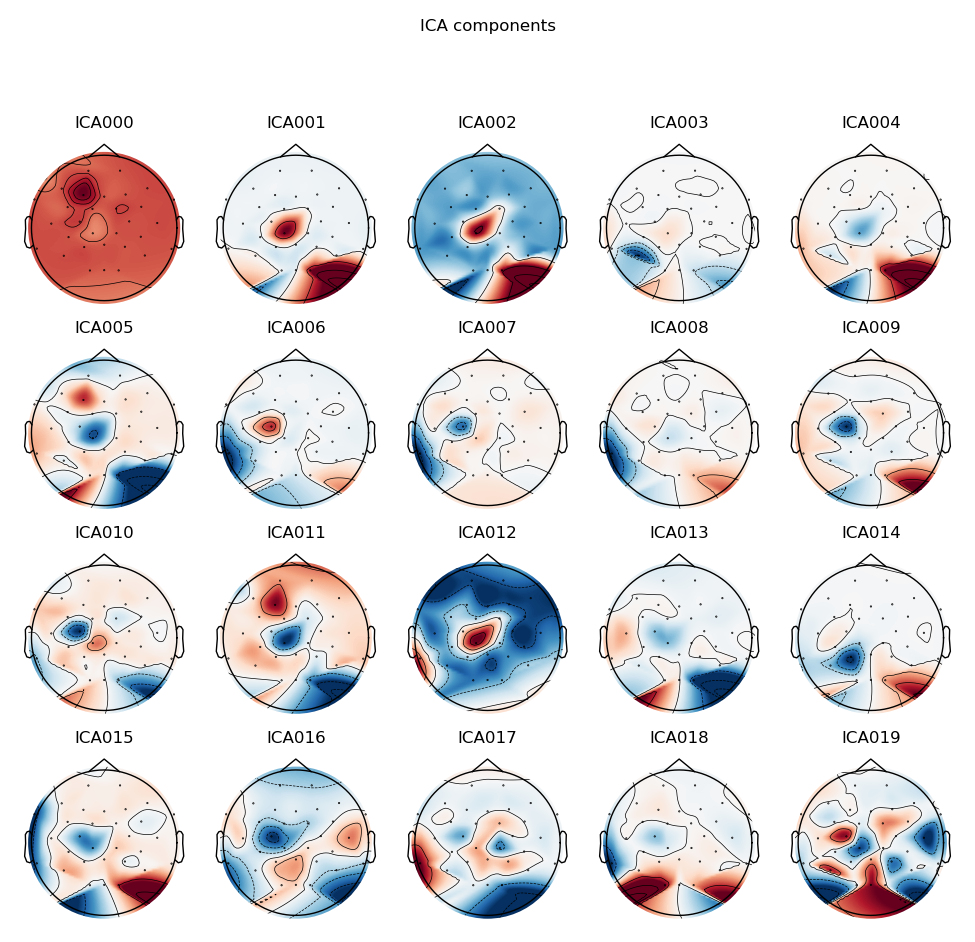

In [14]:
sp1_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 7 ICA components


<IPython.core.display.Javascript object>


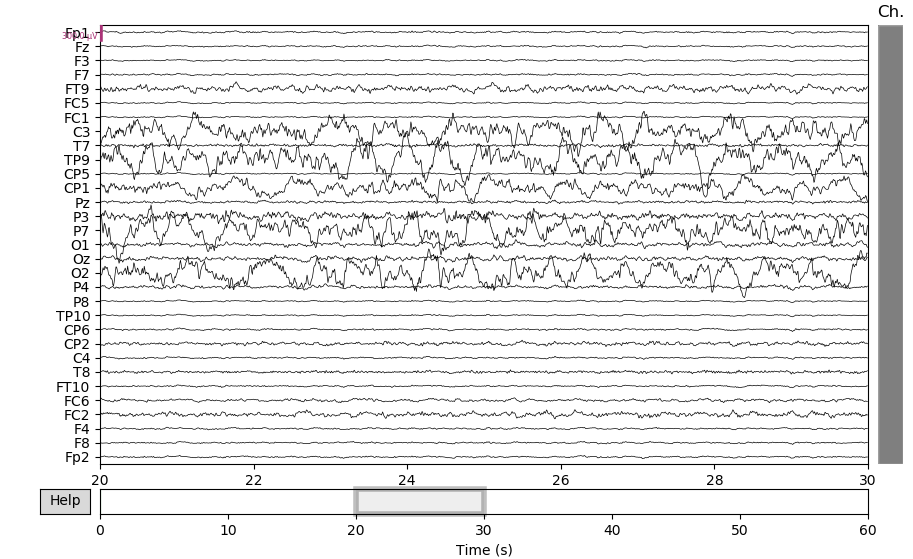

In [15]:
sp1_ica.exclude = [0,1,2,5,11,12,16]
sp1_corrected = sp1_filt.copy()
sp1_ica.apply(sp1_corrected)
sp1_corrected.plot(scalings={"eeg": 15e-5}, title='After ICA (spot 1)', verbose=verbose, start=20, n_channels=31)
plt.show()

**Spot 2**

<IPython.core.display.Javascript object>


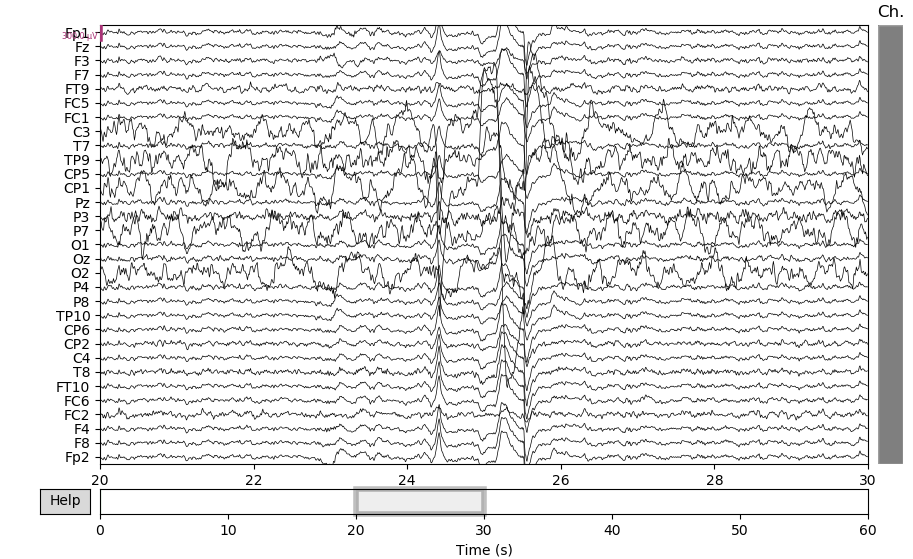

In [16]:
sp2_filt.plot(scalings={"eeg": 15e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 7.5s.


<IPython.core.display.Javascript object>


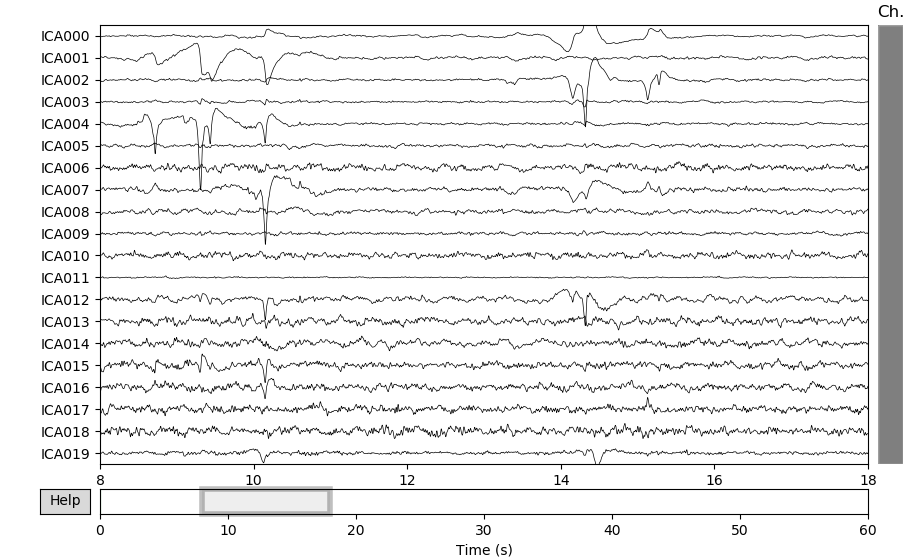

In [17]:
sp2_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(sp2_filt)
sp2_ica.plot_sources(inst=sp2_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


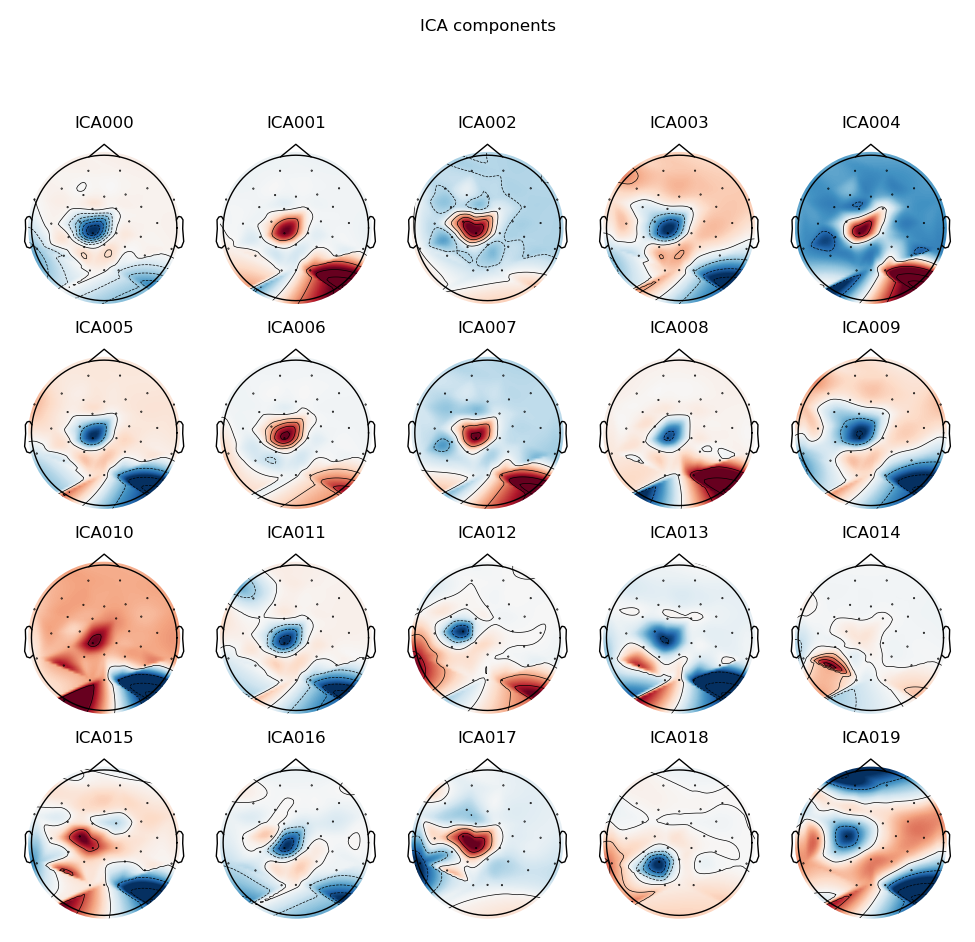

In [18]:
sp2_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 12 ICA components


<IPython.core.display.Javascript object>


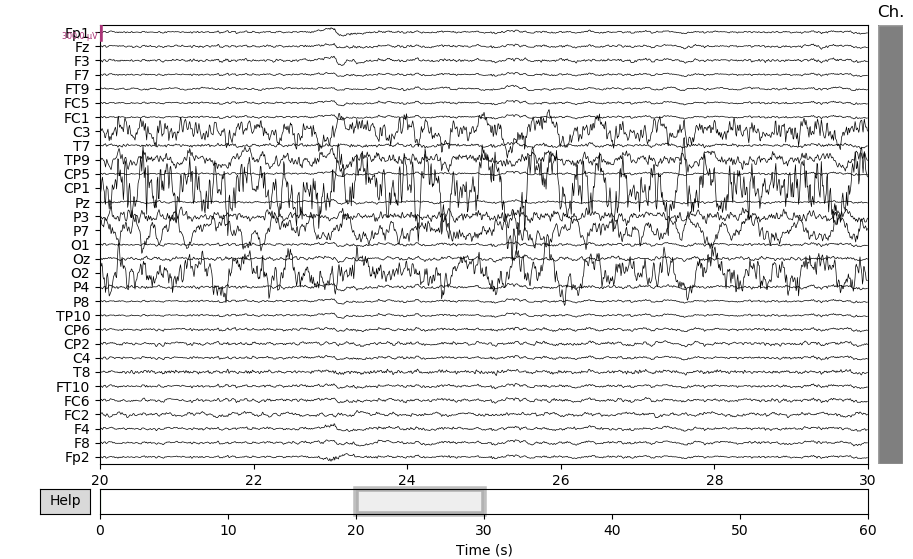

In [19]:
sp2_ica.exclude = [0,1,2,3,4,5,7,9,10,11,12,19]
sp2_corrected = sp2_filt.copy()
sp2_ica.apply(sp2_corrected)
sp2_corrected.plot(scalings={"eeg": 15e-5}, title='After ICA (spot 2)', verbose=verbose, start=20, n_channels=31)
plt.show()

**Spot 3**

<IPython.core.display.Javascript object>


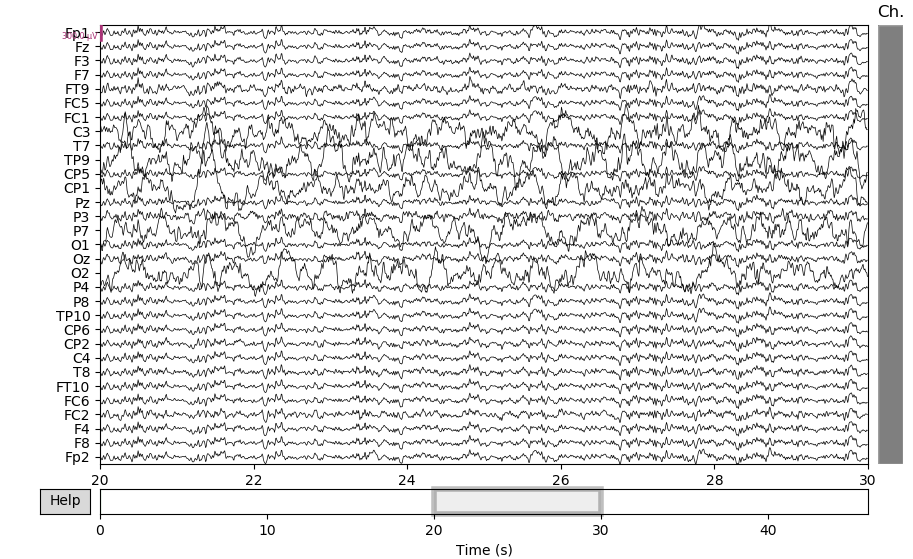

In [20]:
sp3_filt.plot(scalings={"eeg": 15e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 2.0s.


<IPython.core.display.Javascript object>


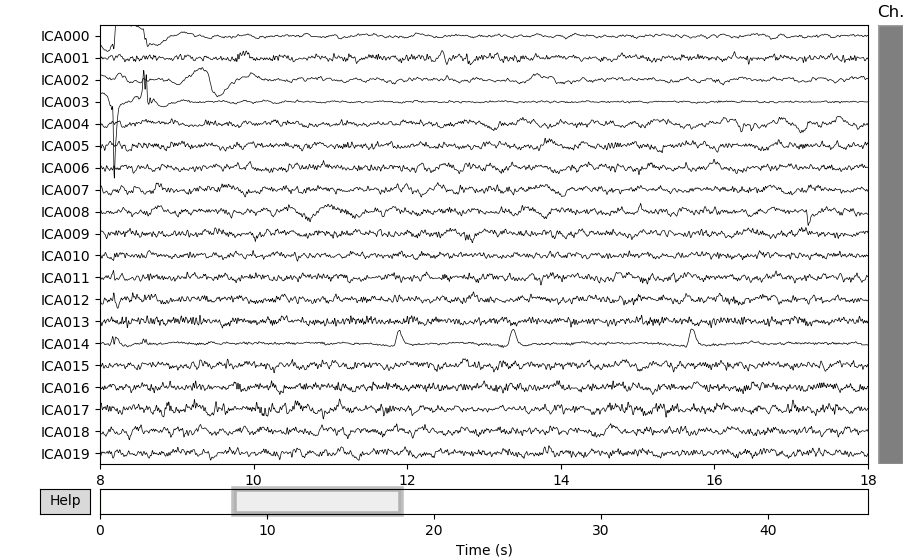

In [21]:
sp3_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(sp3_filt)
sp3_ica.plot_sources(inst=sp3_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


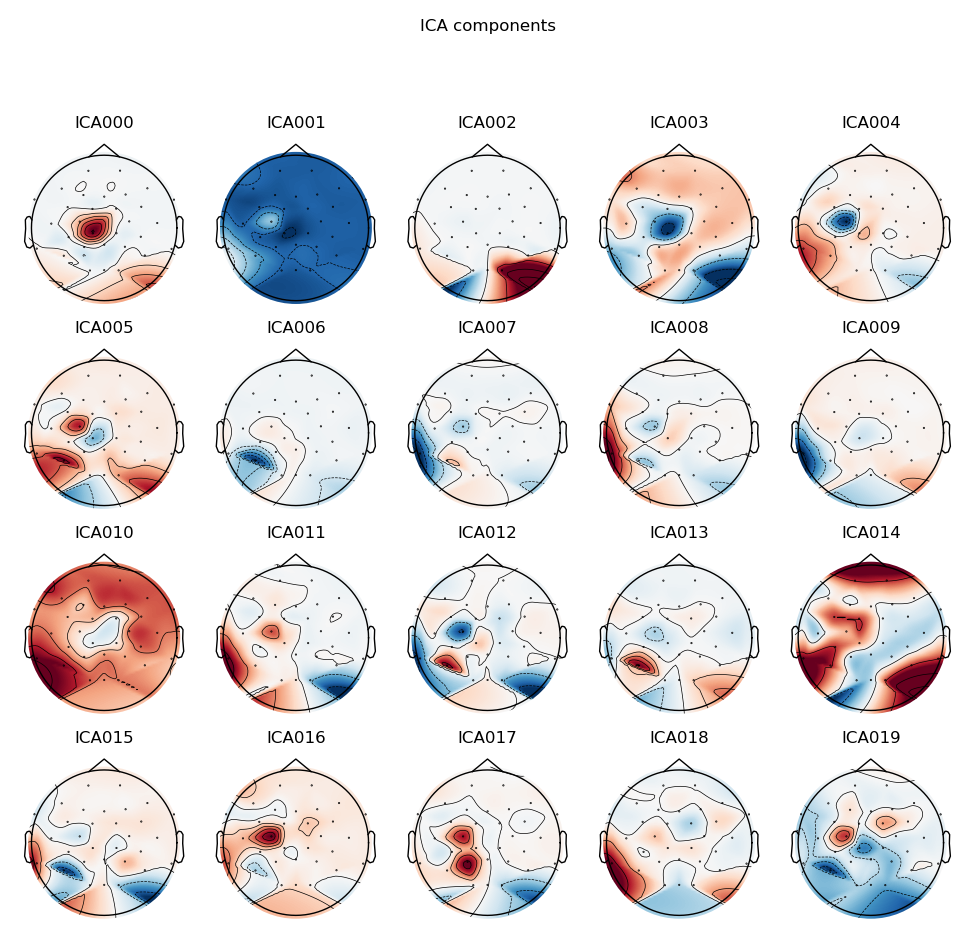

In [22]:
sp3_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 6 ICA components


<IPython.core.display.Javascript object>


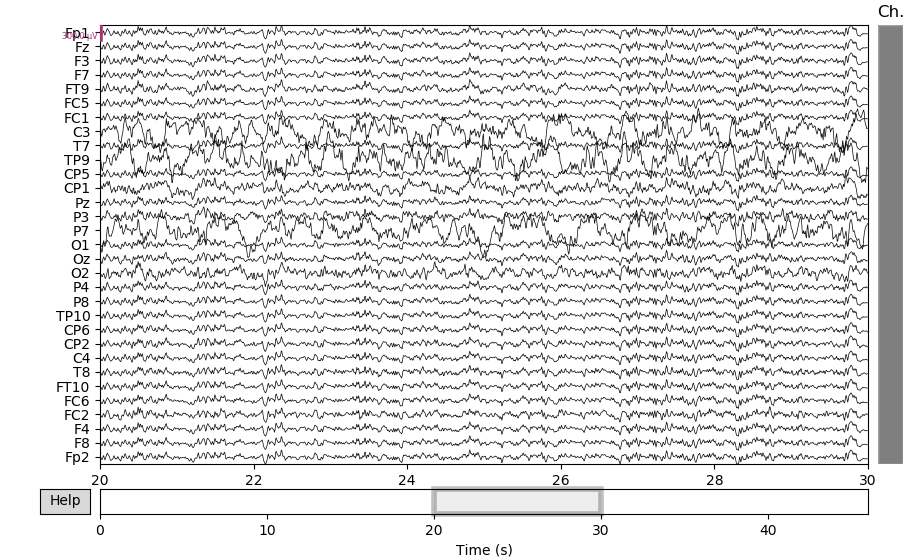

In [23]:
sp3_ica.exclude = [0,2,3,8,10,14]
sp3_corrected = sp3_filt.copy()
sp3_ica.apply(sp3_corrected)
sp3_corrected.plot(scalings={"eeg": 15e-5}, title='After ICA (spot 3)', verbose=verbose, start=20, n_channels=31)
plt.show()

**Spot 4**

<IPython.core.display.Javascript object>


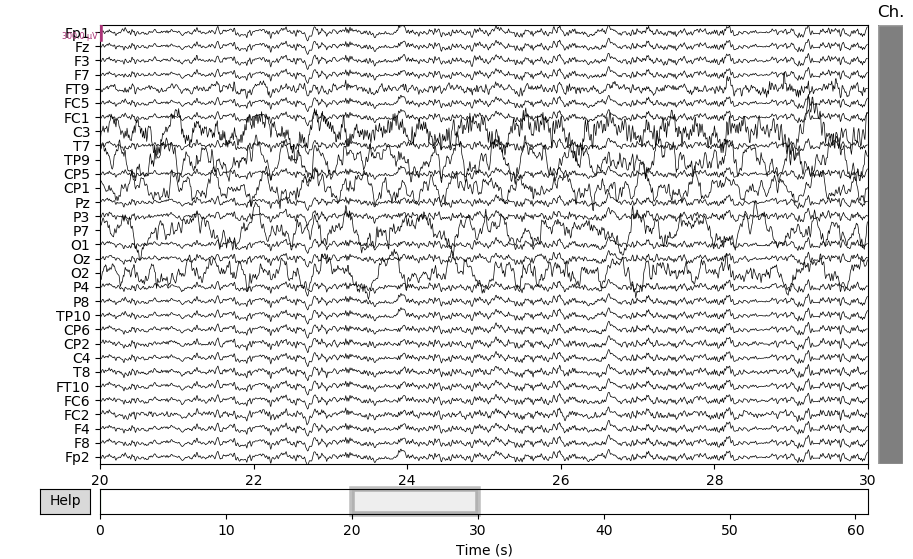

In [24]:
sp4_filt.plot(scalings={"eeg": 15e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 3.4s.


<IPython.core.display.Javascript object>


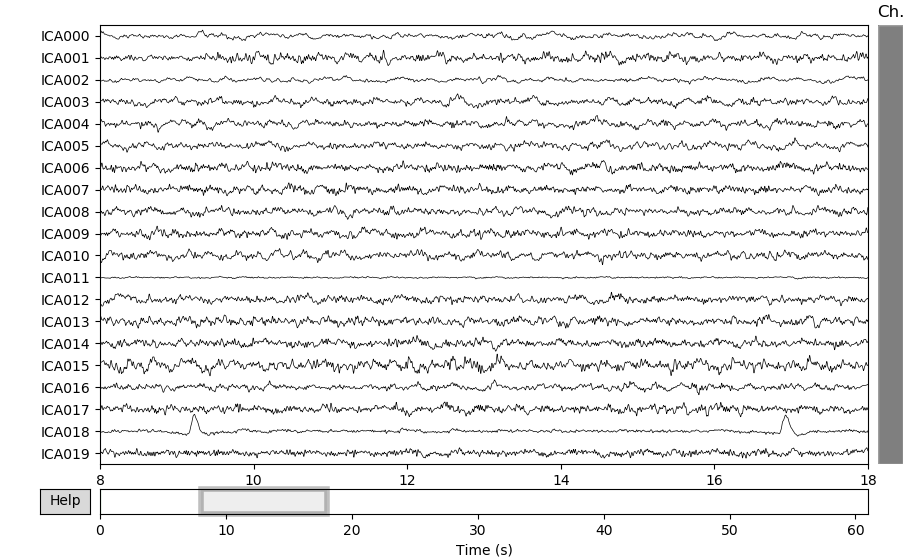

In [25]:
sp4_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(sp4_filt)
sp4_ica.plot_sources(inst=sp4_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


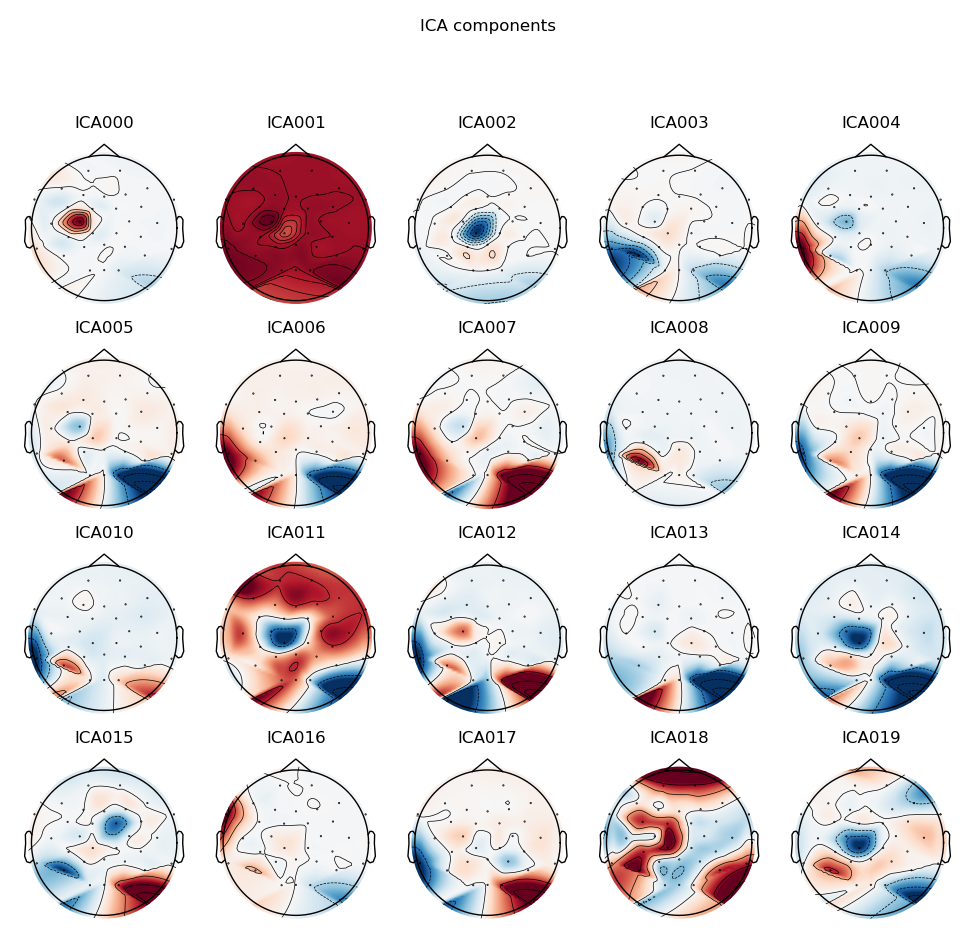

In [26]:
sp4_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 7 ICA components


<IPython.core.display.Javascript object>


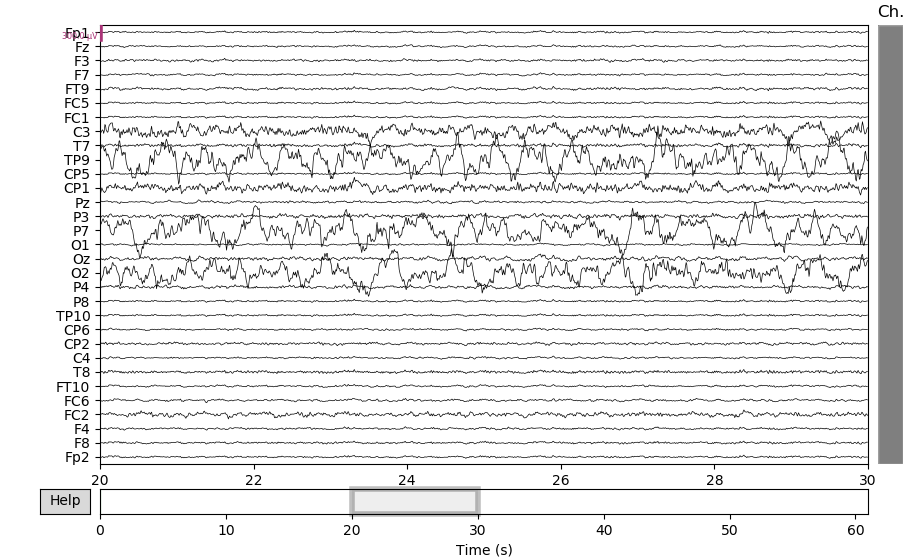

In [27]:
sp4_ica.exclude = [0,1,2,11,16,18,19]
sp4_corrected = sp4_filt.copy()
sp4_ica.apply(sp4_corrected)
sp4_corrected.plot(scalings={"eeg": 15e-5}, title='After ICA (spot 4)', verbose=verbose, start=20, n_channels=31)
plt.show()

**Spot 5**

c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


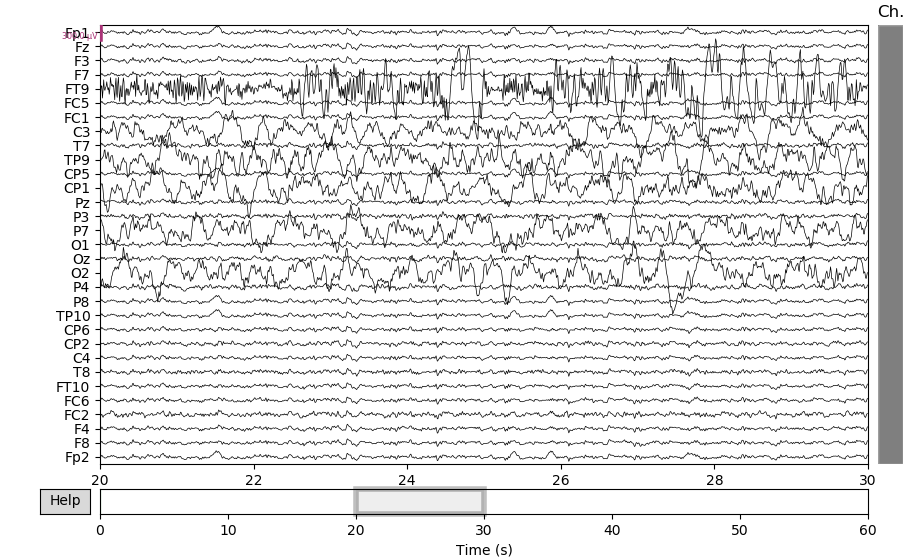

In [28]:
sp5_filt.plot(scalings={"eeg": 15e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 3.4s.


<IPython.core.display.Javascript object>


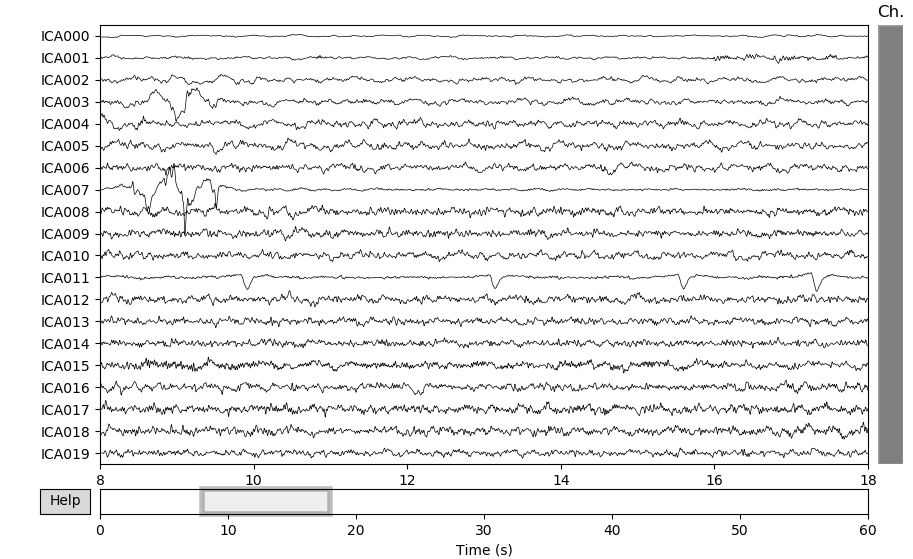

In [29]:
sp5_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(sp5_filt)
sp5_ica.plot_sources(inst=sp5_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


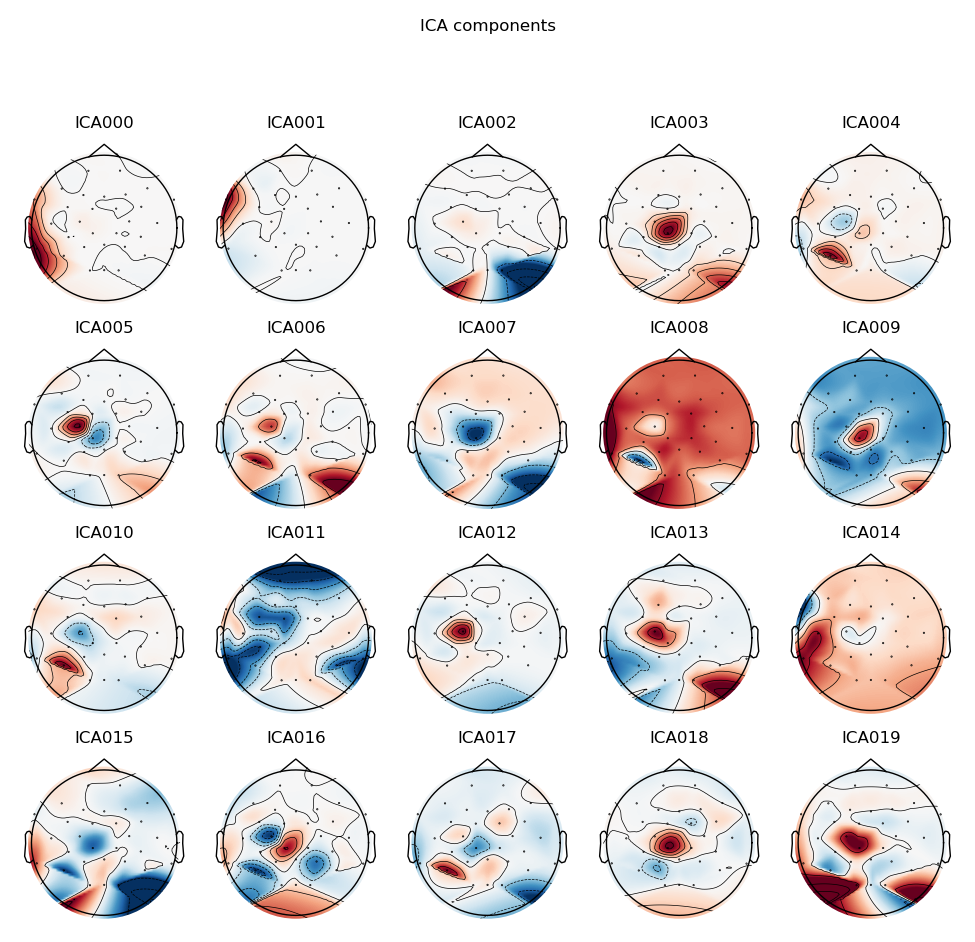

In [30]:
sp5_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 9 ICA components


c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


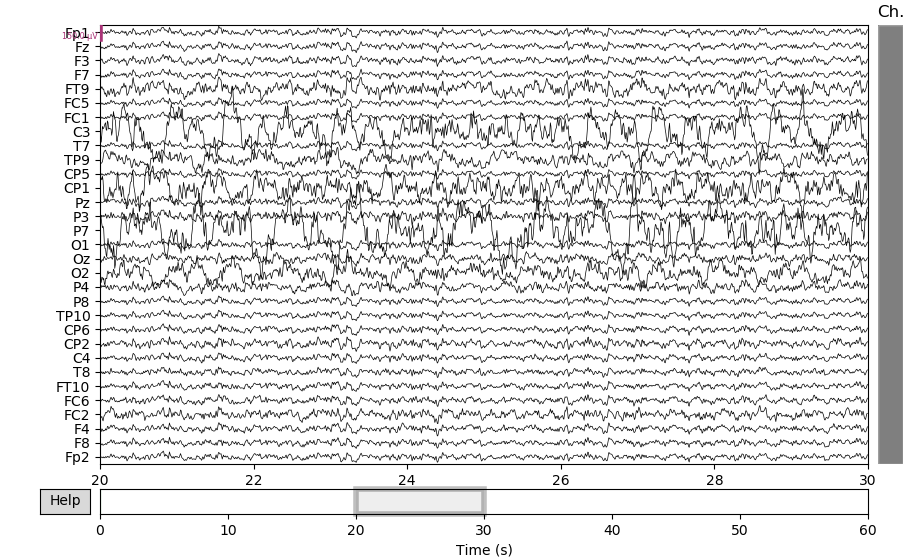

In [31]:
sp5_ica.exclude = [0,1,2,3,7,9,11,14,19]
sp5_corrected = sp5_filt.copy()
sp5_ica.apply(sp5_corrected)
sp5_corrected.plot(scalings={"eeg": 75e-6}, title='After ICA (spot 5)', verbose=verbose, start=20, n_channels=31)
plt.show()

**Spot 6**

<IPython.core.display.Javascript object>


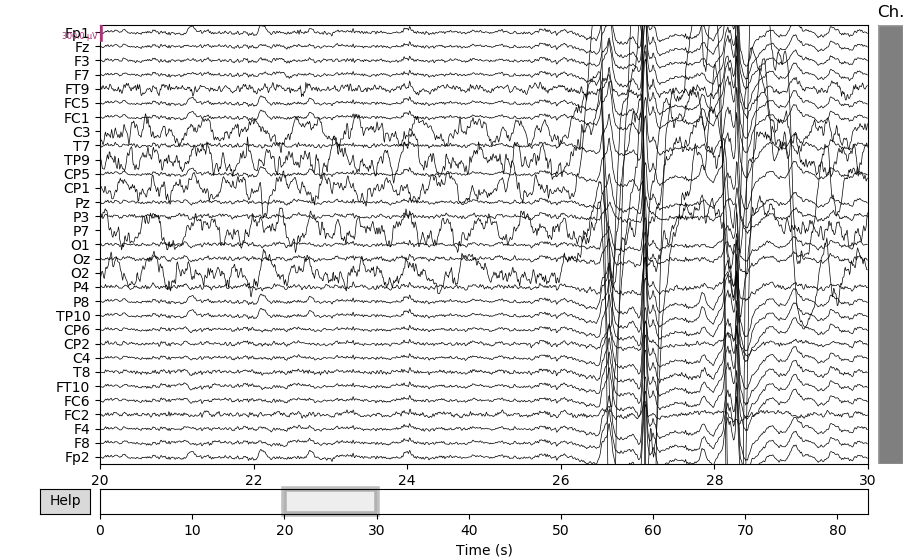

In [32]:
sp6_filt.plot(scalings={"eeg": 15e-5}, n_channels=31, start=20)
plt.show()

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 20 components
Fitting ICA took 6.8s.


<IPython.core.display.Javascript object>


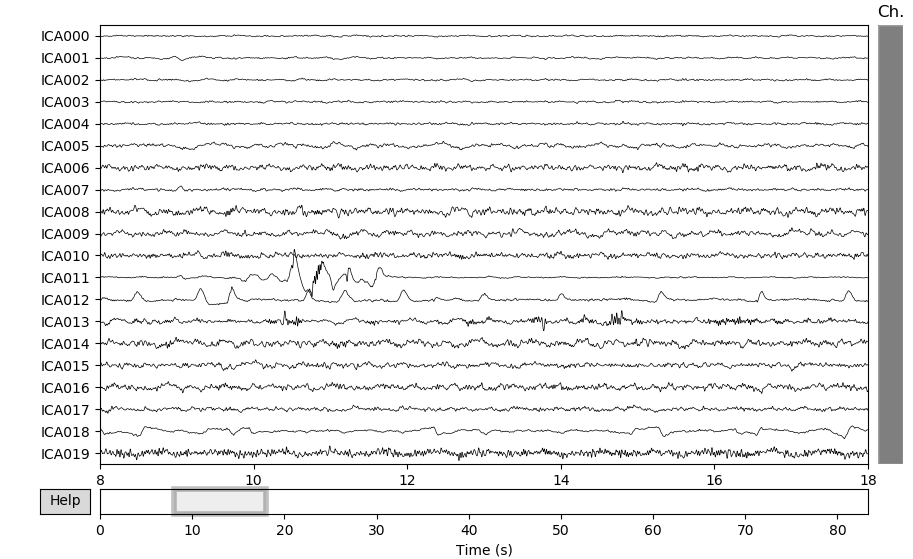

In [33]:
sp6_ica = mne.preprocessing.ICA(n_components=n_components, method='picard', random_state=1, verbose=True).fit(sp6_filt)
sp6_ica.plot_sources(inst=sp6_filt, start=8, stop=18)
plt.show()

<IPython.core.display.Javascript object>


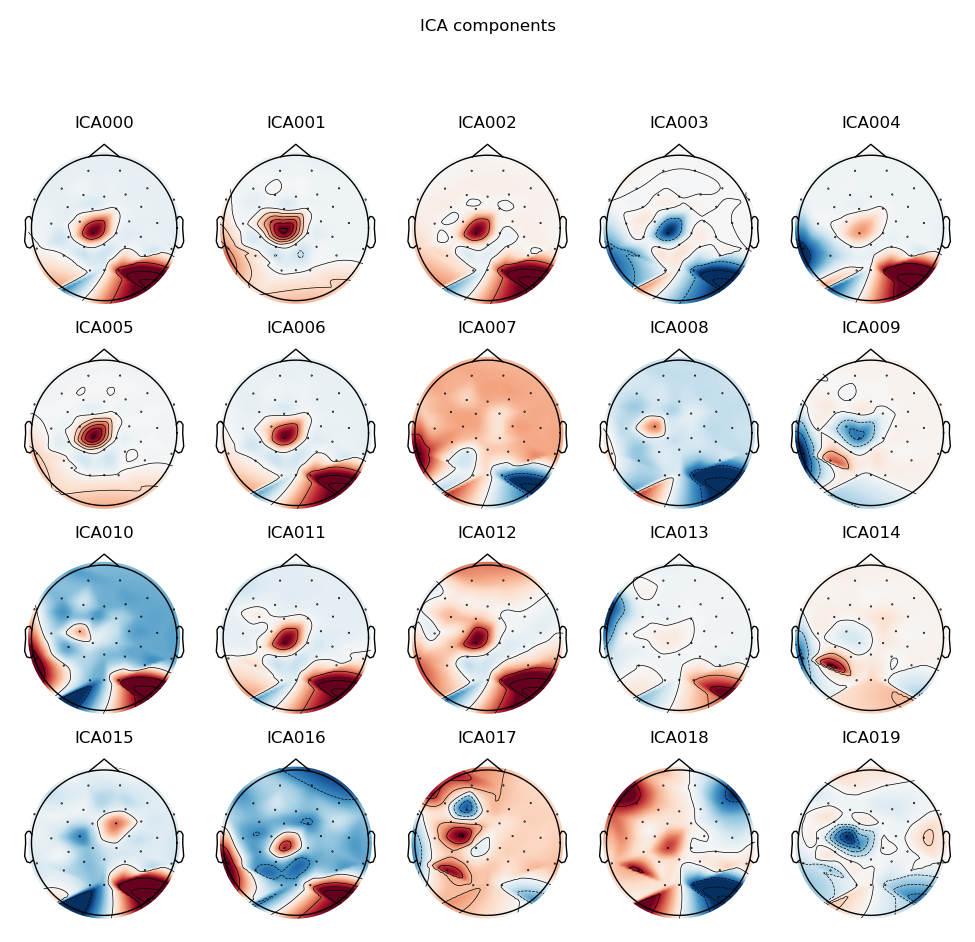

In [34]:
sp6_ica.plot_components()
plt.show()

Transforming to ICA space (20 components)
Zeroing out 17 ICA components


c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


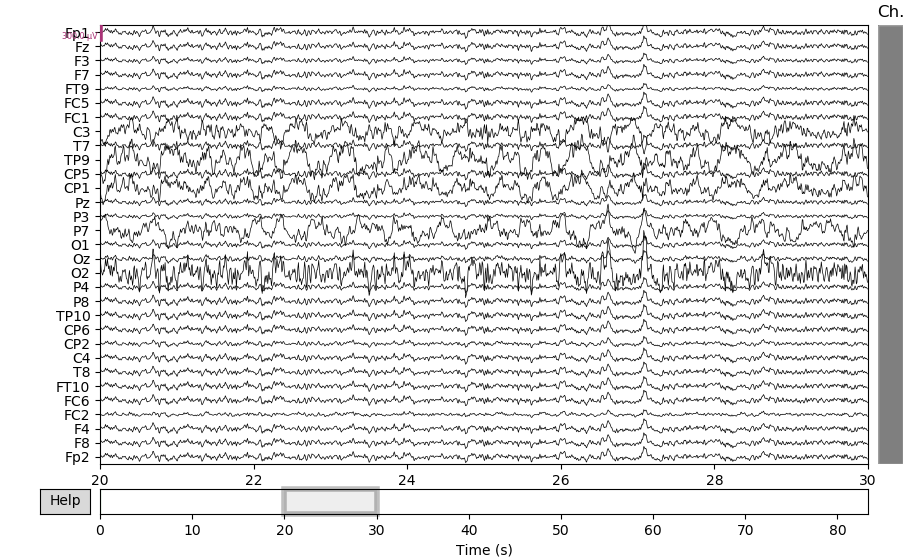

In [35]:
sp6_ica.exclude = [0,1,2,3,4,5,6,7,10,11,12,13,15,16,17,18,19]
sp6_corrected = sp6_filt.copy()
sp6_ica.apply(sp6_corrected)
sp6_corrected.plot(scalings={"eeg": 15e-5}, title='After ICA (spot 6)', verbose=verbose, start=20, n_channels=31)
plt.show()

# FRECUENCY BANDS

In [36]:
#ba
pow_alpha_F3_ba, pow_alpha_F7_ba, pow_alpha_F4_ba, pow_alpha_F8_ba = (get_alpha_pow(2,ba_corrected,fs), 
get_alpha_pow(3,ba_corrected,fs), get_alpha_pow(28,ba_corrected,fs), get_alpha_pow(29,ba_corrected,fs))

#sp1
pow_alpha_F3_sp1, pow_alpha_F7_sp1, pow_alpha_F4_sp1, pow_alpha_F8_sp1 = (get_alpha_pow(2,sp1_corrected,fs), 
get_alpha_pow(3,sp1_corrected,fs), get_alpha_pow(28,sp1_corrected,fs), get_alpha_pow(29,sp1_corrected,fs))

#sp2
pow_alpha_F3_sp2, pow_alpha_F7_sp2, pow_alpha_F4_sp2, pow_alpha_F8_sp2 = (get_alpha_pow(2,sp2_corrected,fs), 
get_alpha_pow(3,sp2_corrected,fs), get_alpha_pow(28,sp2_corrected,fs), get_alpha_pow(29,sp2_corrected,fs))

#sp3
pow_alpha_F3_sp3, pow_alpha_F7_sp3, pow_alpha_F4_sp3, pow_alpha_F8_sp3 = (get_alpha_pow(2,sp3_corrected,fs), 
get_alpha_pow(3,sp3_corrected,fs), get_alpha_pow(28,sp3_corrected,fs), get_alpha_pow(29,sp3_corrected,fs))

#sp4
pow_alpha_F3_sp4, pow_alpha_F7_sp4, pow_alpha_F4_sp4, pow_alpha_F8_sp4 = (get_alpha_pow(2,sp4_corrected,fs), 
get_alpha_pow(3,sp4_corrected,fs), get_alpha_pow(28,sp4_corrected,fs), get_alpha_pow(29,sp4_corrected,fs))

#sp5
pow_alpha_F3_sp5, pow_alpha_F7_sp5, pow_alpha_F4_sp5, pow_alpha_F8_sp5 = (get_alpha_pow(2,sp5_corrected,fs), 
get_alpha_pow(3,sp5_corrected,fs), get_alpha_pow(28,sp5_corrected,fs), get_alpha_pow(29,sp5_corrected,fs))

#sp6
pow_alpha_F3_sp6, pow_alpha_F7_sp6, pow_alpha_F4_sp6, pow_alpha_F8_sp6 = (get_alpha_pow(2,sp6_corrected,fs), 
get_alpha_pow(3,sp6_corrected,fs), get_alpha_pow(28,sp6_corrected,fs), get_alpha_pow(29,sp6_corrected,fs))

# GFPa y AWI

### GFPa

In [38]:
GFPa_right_ba = (pow_alpha_F3_ba**2+pow_alpha_F7_ba**2)/2
GFPa_left_ba = (pow_alpha_F4_ba**2+pow_alpha_F8_ba**2)/2

GFPa_right_sp1 = (pow_alpha_F3_sp1**2+pow_alpha_F7_sp1**2)/2
GFPa_left_sp1 = (pow_alpha_F4_sp1**2+pow_alpha_F8_sp1**2)/2

GFPa_right_sp2 = (pow_alpha_F3_sp2**2+pow_alpha_F7_sp2**2)/2
GFPa_left_sp2 = (pow_alpha_F4_sp2**2+pow_alpha_F8_sp2**2)/2

GFPa_right_sp3 = (pow_alpha_F3_sp3**2+pow_alpha_F7_sp3**2)/2
GFPa_left_sp3 = (pow_alpha_F4_sp3**2+pow_alpha_F8_sp3**2)/2

GFPa_right_sp4 = (pow_alpha_F3_sp4**2+pow_alpha_F7_sp4**2)/2
GFPa_left_sp4 = (pow_alpha_F4_sp4**2+pow_alpha_F8_sp4**2)/2

GFPa_right_sp5 = (pow_alpha_F3_sp5**2+pow_alpha_F7_sp5**2)/2
GFPa_left_sp5 = (pow_alpha_F4_sp5**2+pow_alpha_F8_sp5**2)/2

GFPa_right_sp6 = (pow_alpha_F3_sp6**2+pow_alpha_F7_sp6**2)/2
GFPa_left_sp6 = (pow_alpha_F4_sp6**2+pow_alpha_F8_sp6**2)/2

### AWI

In [39]:
AW_ba  = GFPa_right_ba  - GFPa_left_ba
AW_sp1 = GFPa_right_sp1 - GFPa_left_sp1
AW_sp2 = GFPa_right_sp2 - GFPa_left_sp2
AW_sp3 = GFPa_right_sp3 - GFPa_left_sp3
AW_sp4 = GFPa_right_sp4 - GFPa_left_sp4
AW_sp5 = GFPa_right_sp5 - GFPa_left_sp5
AW_sp6 = GFPa_right_sp6 - GFPa_left_sp6

## SAVE INDEX

In [40]:
row=str(subject)+','+str(AW_ba)+','+str(AW_sp1)+','+str(AW_sp2)+','+str(AW_sp3)+','+str(AW_sp4)+','+str(AW_sp5)+','+str(AW_sp6)
file = open('AWI.csv','r+')
lines=file.readlines()
sb=[]
for line in lines:
    sb.append(line[0:4])
if row[0:4] in sb:
    file.close()
else:
    file.write(row)
    file.write('\n')  
file.close()

col=['Subject','AWI ba', 'AWI sp1', 'AWI sp2', 'AWI sp3', 'AWI sp4', 'AWI sp5', 'AWI sp6']
df=pd.read_csv('AWI.csv', names= col)
df

,Subject,AWI ba,AWI sp1,AWI sp2,AWI sp3,AWI sp4,AWI sp5,AWI sp6
0,8091,-3.062376e-15,2.024494e-16,-9.416454e-16,-2.276340e-13,-2.454843e-16,-2.481206e-15,-1.047826e-15
1,6401,-9.252760e-18,-2.400573e-16,-2.633969e-16,-1.090815e-16,-1.631661e-16,3.993431e-14,2.240832e-17
2,2900,1.395716e-16,-9.143797e-20,-4.260692e-19,3.028034e-17,7.112190e-19,4.090293e-18,-1.930683e-16
